In [ ]:
#!unzip "drive/MyDrive/Data/dog-breed-identification (1).zip" -d "drive/MyDrive/Data"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## ✅**Image classifier project using tensorflow**
* 1) problem statement: Given a dataset of dog images which had 10222 images i had to create a   model for identifying each dog breed 🐕
* 2) Data: The data was huge so converting into batches was required so made a function to train data in batches and feed into the model📚
* 3) Evaluation: Visualizing Data batches for better understanding 🐶
* 4) Modelling: Model used is mobilenet V2 which uses CNN for classification of images 🤖
* 5) Tuning: Changing the no of epochs

By ©️ Saumik Sarkar



In [ ]:
#Start by importing tensorflow

In [ ]:
##Getting project files ready now



1.   Importing tensorflow ✅
2.   Importing tensorflow hub ✅
3.   Importing a GPU ✅






In [1]:

import tensorflow as tf
import tensorflow_hub as hub
print("hub version:", hub.__version__)
print("version:", tf.__version__)
print("GPU","available(YES)" if tf.config.list_physical_devices("GPU") else "Not available")

hub version: 0.13.0
version: 2.12.0
GPU available(YES)


In [2]:
## turning data into tensors
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Data/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


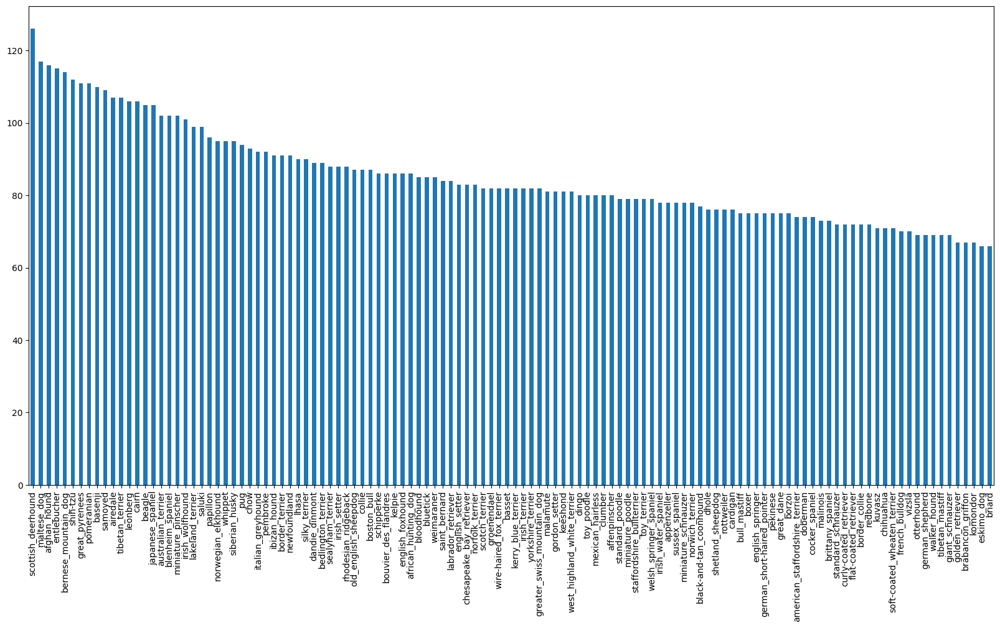

In [3]:
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(20,10));

In [4]:
labels_csv["breed"].value_counts().median()

82.0

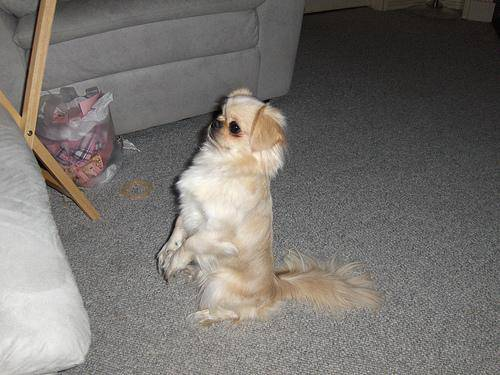

In [5]:
from IPython.display import Image
Image("drive/MyDrive/Data/train/001cdf01b096e06d78e9e5112d419397.jpg")

⚓**Creating a list of ID for all dog names**


In [6]:
filenames=["drive/MyDrive/Data/train/"+fname+".jpg" for fname in labels_csv["id"]]

In [7]:
import os
if len(os.listdir("drive/MyDrive/Data/train/")) == len(filenames):
  print("All the data lengths matched");
else:
  print("No match of Data")

All the data lengths matched


In [8]:
##creating labels
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [9]:
len(labels)

10222

In [10]:
##finding the unique label values
unique_labels=np.unique(labels);
len(unique_labels)


120

In [11]:
##turning the labels into boolean array (label Encoding)
boolean_label=[labels==unique_labels for labels in labels]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

#Creating a validation Set ☁

In [12]:
print(len(boolean_label))
X=filenames
Y=boolean_label

10222


In [13]:
## Training the model with less data and the increasing the data
## so create a slider
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10000,step:1000}

Splitting data into training and validation set:

In [14]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
X_train,X_test,Y_train,Y_test=train_test_split(X[:NUM_IMAGES],
                                                 Y[:NUM_IMAGES],
                                               test_size=0.2,random_state=42)
len(X_train),len(X_test),len(Y_train),len(Y_test)

(800, 200, 800, 200)

##Image to tensors

In [15]:
#convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[40])
image.shape


(293, 400, 3)

In [16]:
#as i have converted the images to tensors now we can feed it into the machine learning model
tf.constant(image)

<tf.Tensor: shape=(293, 400, 3), dtype=uint8, numpy=
array([[[255, 246, 252],
        [254, 237, 243],
        [253, 237, 240],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 251, 249],
        [255, 246, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 141,  72]],

       [[238, 236, 221],
        [244, 245, 229],
        [231, 232, 214],
        ...,
        [ 87, 137,  64],
        [ 85, 135,  64],
        [ 95, 146,  77]],

       ...,

       [[125, 142,  72],
        [118, 136,  84],
        [122, 145, 103],
        ...,
        [124, 142, 102],
        [142, 162, 125],
        [179, 201, 165]],

       [[113, 130,  60],
        [111, 129,  77],
        [119, 142, 100],
        ...,
        [122, 140, 100],
        [136, 156, 119],
        [170, 192, 156]],

       [[106, 123,  52],
        [104, 122,  70],
        [113, 136,  92],
        ...,
        [122, 140, 10

###Make a function to preprocess all the **images**:


**Note** : All of the images should be preprocessed according to the scaled image size of 224x224 because of the input size of MobileNetV2

In [17]:
IMG_SIZE=224
##a function to preprocess images for feeding it into model
def process(image_path):
  #Reading and image file
  image=tf.io.read_file(image_path)
  #making color channels
  image=tf.image.decode_jpeg(image,channels=3)
  #scale data into numbers between 0,1 makes the predictions more efficent and improves cross val score
  image=tf.image.convert_image_dtype(image,tf.float32)
  ## resize image for perfect square
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image


In [18]:
#turning data into batches
##processing all images at once may take overflow of GPU
#we need to create a tuple to feed into the machine learning model in the form of (image,label)
def get_image_label(image_path,label):
  image=process(image_path)
  return image,label;


In [19]:
(process(X[42]),Y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

#### Created a Batch data function in order to feed the model data batches of 32 images

In [20]:
##Function to turn data into batches
BATCH_SIZE=32;
def create_data_batches(X,Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  #test data sets have no labels
  if test_data:
    print("Creating test data batches");
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process).batch(BATCH_SIZE)
    return data_batch
  ##validation data set has labels
  elif valid_data:
    print("Creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    ##test data has also to be shuffled
    print("Creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    ##shuffling pathnames and labels before matching into bathces
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    ##finally turning the data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [21]:
train_data=create_data_batches(X_train,Y_train)
valid_data=create_data_batches(X_test,Y_test,valid_data=True)

Creating training data batches
Creating validation data batches


##Visualizing Data Batches 🐶


In [22]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  #Display 25 images plot at a time
  plt.figure(figsize=(10,10))
  for i in range(25):
    #Creating subplot (5rows,5 colums)
    ax=plt.subplot(5,5,i+1)
    #displaying the imaeg now
    plt.imshow(images[i])
    #image label will be the breed name
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")

In [23]:
unique_labels[:5]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier'], dtype=object)

In [24]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [25]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

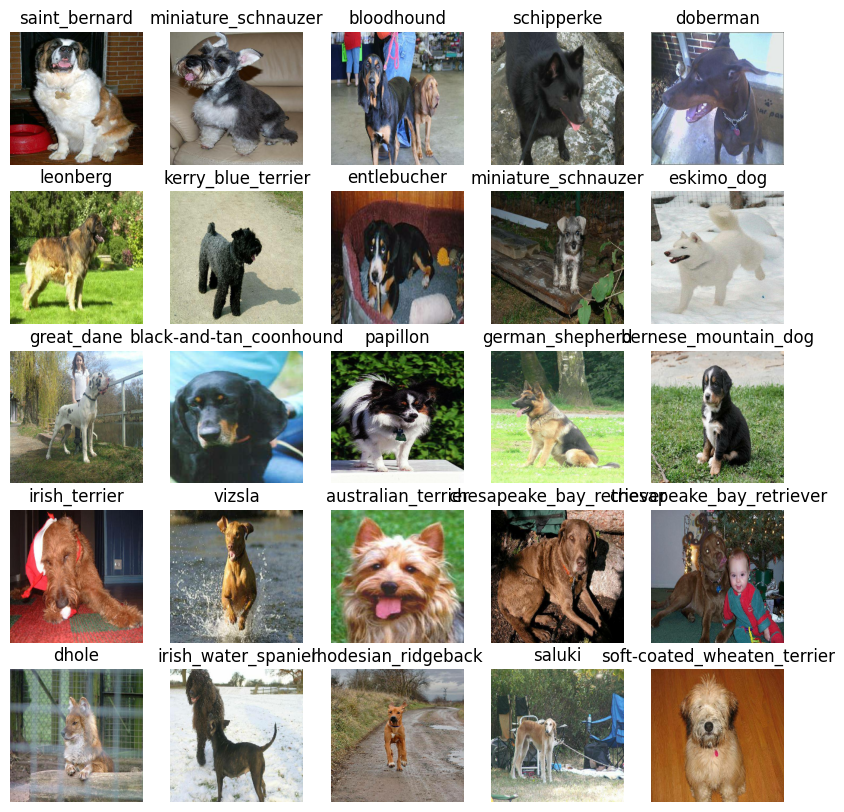

In [26]:
show_25_images(train_images,train_labels)

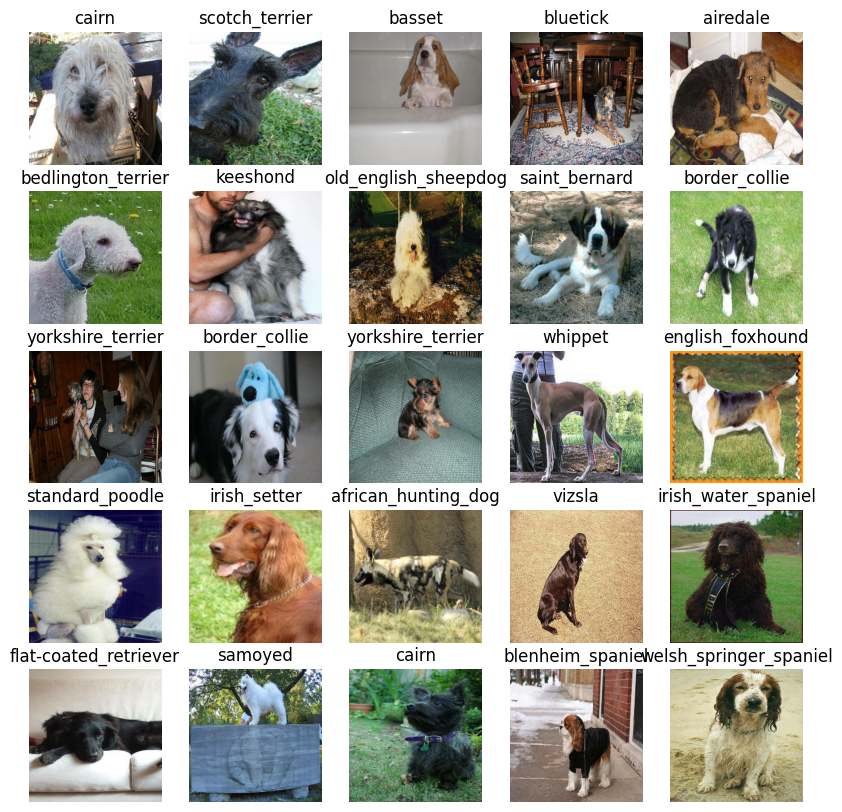

In [27]:
val_images,val_labels=next(valid_data.as_numpy_iterator())
show_25_images(val_images,val_labels)


## ✅**Modelling** 🐶
Model taken from tfhub = https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [28]:
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3] #format is [batch,height,width,color channels] //input image shape
OUTPUT_SHAPE=len(unique_labels) #Output image shape
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [29]:
len(unique_labels)

120

Keras deep learning model (Sequential) info in - https://www.tensorflow.org/guide/keras/sequential_model


**Note** : Transfer Learning where the conv base is taken from MobileNet V2 and the Dense Layer and Output layer is supplied

In [30]:
#Using keras deep learning model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Model:" ,MODEL_URL)
  model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), #layer1(Input)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") #Layer2(OUTPUT) //we will scale the output to all unique labels because we don't need 1280 outputs by onvolution
   ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(), #function to optimize paths to reach target
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  return model


In [31]:
model=create_model()
model.summary()

Model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


####Callback Function ( Helper to track training progress and stop from overfitting and stop model from training too long): ✅

In [32]:
%load_ext tensorboard

In [33]:
import datetime

def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/Data/logs",datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [34]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)#this is for preventing overfitting model
 #if the model takes too much time t train

In [35]:
##training model
EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}


In [36]:
##function to create and train the model with every batch of epoch or data
def train_model():
  model=create_model() #calling the create model created above
  tensorboard=create_tensorboard_callback() #everytime batch trained store it in the logs
  ##fiting the data into the model
  model.fit(x=train_data,epochs=EPOCHS,validation_data=valid_data,validation_freq=1,callbacks=[tensorboard, early_stopping])
  return model

In [37]:
model=train_model()

Model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 7:18 - loss: 5.7577 - accuracy: 0.0000e+00

KeyboardInterrupt: ignored

In [ ]:
## From above the train Data accuraccy is 1.000 or 100% whereas valid_data accuracy is just 65% means the model is overfitting

####USING TensorBoard to evaluate log files

In [38]:
%tensorboard --logdir "/content/drive/MyDrive/Data/logs/04072023-075015"

<IPython.core.display.Javascript object>

*Making predictions using validation data* 🐶


In [ ]:
predictions=model.predict(valid_data,verbose=1)
predictions


7/7 [==============================] - 39s 90ms/step


array([[4.8169079e-03, 7.1559356e-05, 1.6798651e-03, ..., 3.9680334e-04,
        2.9463956e-05, 5.8611110e-03],
       [4.5391601e-03, 7.8358775e-04, 1.6246861e-02, ..., 2.3321182e-04,
        6.8652182e-04, 9.1741131e-05],
       [1.3252163e-06, 1.2339453e-05, 1.0183959e-05, ..., 1.9157174e-05,
        4.4903250e-06, 1.3078476e-04],
       ...,
       [1.8744641e-06, 4.1462990e-05, 1.2954800e-05, ..., 1.5173412e-05,
        3.0950981e-05, 9.7483671e-06],
       [2.8686433e-03, 4.0345047e-05, 6.1980179e-05, ..., 6.5087865e-05,
        1.7785034e-04, 4.8172404e-03],
       [9.2029967e-04, 4.3399221e-05, 4.6569604e-04, ..., 5.8548055e-03,
        9.5924595e-04, 2.1259658e-04]], dtype=float32)

In [ ]:
predictions.shape #200 arrays of 120 different numbers
len(unique_labels) ## this means our dog data had 120 unique label and every image has a 200 array matrix of probabilites of patterns of images

120

In [ ]:
index=0
print(predictions[index])
print(f"Max value of prediction: {np.max(predictions[index])}") ##max value of pattern found
print(f"Sum:{np.sum(predictions[index])}") #softmax sum which will result to 1
print(f"Max index:{np.argmax(predictions[index])}") # max index of the prediction label that identifies a dog
print(f"Predicted Label:{unique_labels[np.argmax(predictions[index])]}") # predicted label



[4.81690792e-03 7.15593560e-05 1.67986506e-03 1.03479666e-04
 6.14646415e-05 3.30418698e-05 1.28088873e-02 2.16796398e-04
 5.15691718e-05 9.53874609e-04 3.47602123e-04 2.15877044e-05
 3.29695060e-04 8.09594530e-06 1.14723633e-03 9.38989833e-05
 3.86188440e-05 8.46261606e-02 7.36475249e-06 3.06099362e-04
 5.71975019e-04 7.07184518e-05 3.39984581e-05 3.33905919e-03
 1.82438689e-05 2.48038647e-04 4.18410808e-01 1.09093548e-04
 9.38404410e-04 3.01423017e-04 5.05321004e-05 8.76058650e-04
 1.67988590e-03 1.08593449e-04 2.05702352e-04 1.14271147e-02
 9.00781833e-06 1.61535179e-04 5.45114890e-05 7.99232439e-05
 3.16801219e-04 4.72360443e-05 1.25708859e-04 1.86301244e-04
 5.77720202e-05 4.62242053e-04 2.09058690e-05 2.34534658e-04
 4.11195069e-04 8.42536247e-05 1.32797039e-04 4.67933351e-05
 1.79382303e-04 1.64161374e-05 1.05945735e-04 9.55930864e-06
 5.53933787e-04 7.28406291e-03 1.90334860e-04 5.46107665e-02
 3.29464849e-04 7.79695838e-05 2.21119449e-03 2.67036685e-05
 1.63264282e-04 1.639210

### Predicted label to its image for actual visualisation and comparison with its truth label  ✅

In [ ]:
##transform predictions probabilities into labels
def get_pred_label(pred_probabilities):
  return unique_labels[np.argmax(pred_probabilities)]
pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
valid_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

### After we have our predicited labels it is important to now compare them with the valid data
##### for that first unbatch teh valid data and the compare it with predicted labels

In [ ]:
##function to unbatch the data
##using unbatch().as_numpy_iterator() fcn
def unbatchify(data):
  ## this fucntion will take the batch dataset from validation data and return images and labels into seperated lists
  images=[] # sepeeated all values of validtion images into this list
  labels=[] # seperated all values of validation iamges into this list
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images, labels

val_images,val_labels=unbatchify(valid_data);
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

The things that are complete ✅

1.   prediction labels
2.   validation labels
3.   validation images

Making a function where: 🤖


*   Takes an array of prediction probabilites and array of truth labels
*   plots the predicted label,its predicted probability and the truth value





In [ ]:
def plot_pred(pred_probabilities,labels,images,n=1):
  pred_prob,true_label,image=pred_probabilities[n],labels[n],images[n]
  ##pred label
  pred_label=get_pred_label(pred_prob)
  #plotting
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if(pred_label==true_label):
    color="green"
  else:
    color="red"
  plt.title("Predicted:{} Accuracy:{:2.0f}% True:{}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

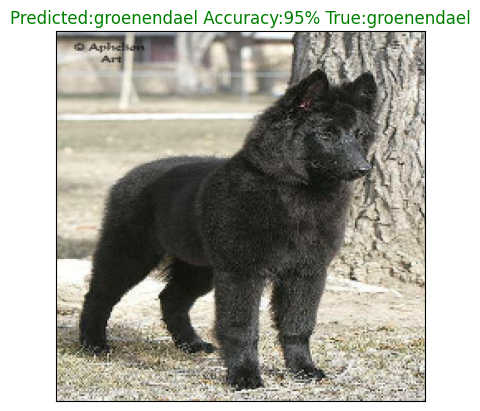

In [ ]:
plot_pred(pred_probabilities=predictions,labels=val_labels,images=val_images,n=45)


**Note** : The above image label is green that means the model has correctly predicted the true label and predicted label ✅

##### Defining a function to check maximum dependency of probability values for turning the label green or correct value


In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  #getting the predicted label
  pred_label=get_pred_label(pred_prob)
  #top 10 prediciton confidence index
  top_10_pred=pred_prob.argsort()[-10:][::-1]
  #top 10 prediciton confidence values
  top_10_values=pred_prob[top_10_pred]
  #top 10 prediction labels
  top_10_labels=unique_labels[top_10_pred]

  top_plot=plt.bar(np.arange(len(top_10_labels)),top_10_values,color='grey')

  plt.xticks(np.arange(len(top_10_labels)),labels=top_10_labels,rotation="vertical")

  ##if the truth label is present in the top 10 predicted
  if np.isin(true_label,top_10_labels):
    top_plot[np.argmax(top_10_labels==true_label)].set_color("green")
  else:
    pass

In [ ]:
unique_labels[predictions[0].argsort()[-10:][::-1]] ##SO for image in 0th index these are the top 10 predicted labels

array(['cairn', 'soft-coated_wheaten_terrier', 'border_terrier',
       'miniature_schnauzer', 'irish_wolfhound', 'lhasa', 'silky_terrier',
       'tibetan_terrier', 'komondor', 'standard_schnauzer'], dtype=object)

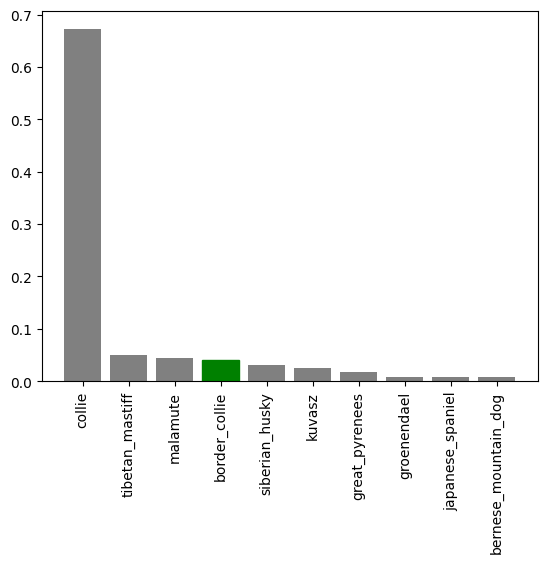

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

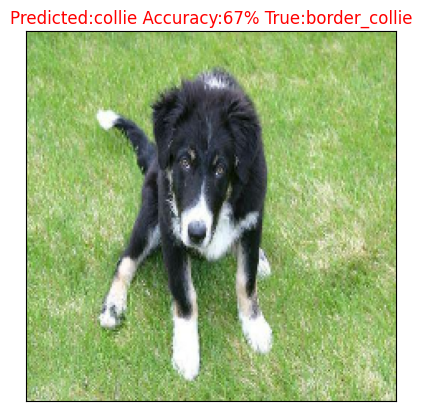

In [ ]:
plot_pred(pred_probabilities=predictions,labels=val_labels,images=val_images,n=9)
#SO the predicted was collie from the graph which doesn't match the truth label hence this wrong predicition

Complete!!! 🐕

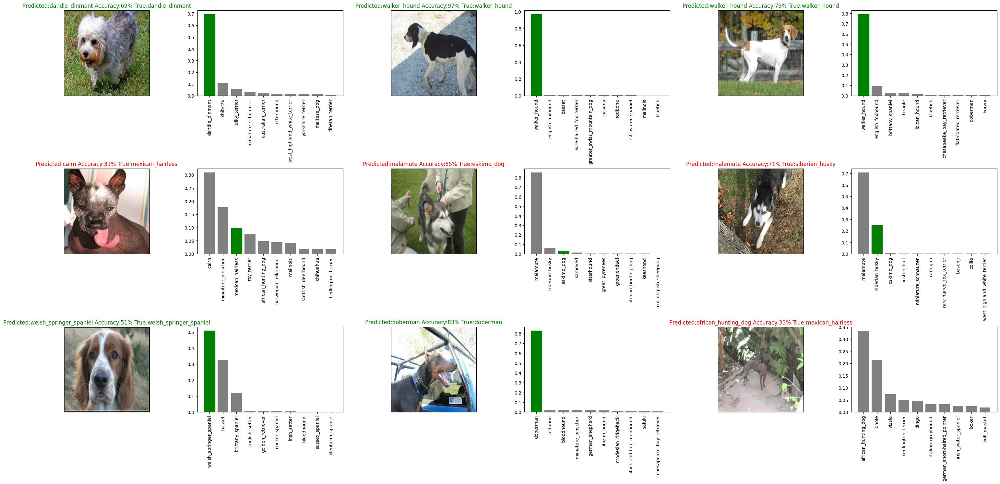

In [ ]:
#plotting different subplots
i_multiplier = 30 # constant index of images
num_rows = 3
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pred_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Done!! So saving the model now for not to be retrained again**

In [ ]:
# from sklearn import metrics
# confusion_matrix = metrics.confusion_matrix(val_labels, predictions)
def save_model(model, suffix=None):

  # Creates model directory with current time
  modeldir = os.path.join("drive/MyDrive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
##Function to load the saved model
def load_model(model_path):
  print(f"Loading Saved model:{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  #custom objects will automatically import keras layers along with the model when loaded
  return model

In [ ]:
save_model(model,suffix="trained_model_1000")

Saving model to: drive/MyDrive/Data/models/20230704-07541688457275-trained_model_1000.h5...


'drive/MyDrive/Data/models/20230704-07541688457275-trained_model_1000.h5'

In [ ]:
loading_1000_image_model=load_model("/content/drive/MyDrive/Data/models/20230704-07541688457275-trained_model_1000.h5")

Loading Saved model:/content/drive/MyDrive/Data/models/20230704-07541688457275-trained_model_1000.h5


In [ ]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 89ms/step - loss: 1.1958 - accuracy: 0.6750


[1.1958317756652832, 0.675000011920929]

In [ ]:
loading_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 1s 82ms/step - loss: 1.1958 - accuracy: 0.6750


[1.1958317756652832, 0.675000011920929]

### Training the model on full data 🐶




In [ ]:
len(X),len(Y)

(10222, 10222)

In [ ]:
## need full data batch with create data batches function
full_data=create_data_batches(X,Y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
## defining the full model
full_model=create_model()

Model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
##creating full model callbacks
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
%%time
##fitting the model
full_model.fit(x=full_data,epochs=EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 106ms/step - loss: 1.3321 - accuracy: 0.6711
Epoch 2/100
320/320 [==============================] - 32s 101ms/step - loss: 0.4018 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 35s 109ms/step - loss: 0.2395 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 32s 101ms/step - loss: 0.1503 - accuracy: 0.9664
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1092 - accuracy: 0.9769
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0774 - accuracy: 0.9852
Epoch 7/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0584 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0465 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0383 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 32s 101m

In [ ]:
save_model(full_model,suffix="full_image_model_MBV2")

Saving model to: drive/MyDrive/Data/models/20230704-08151688458536-full_image_model_MBV2.h5...


'drive/MyDrive/Data/models/20230704-08151688458536-full_image_model_MBV2.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/Data/models/20230704-08151688458536-full_image_model_MBV2.h5")

Loading Saved model:drive/MyDrive/Data/models/20230704-08151688458536-full_image_model_MBV2.h5


In [ ]:
len(X)

10222

### Testing on the test Dataset Using the full_model 🐕

**Note** : the model was trained in the form of image tensor batches
1. Get test image filenames : ✅
2. First converting the test data set into test data batches using the
create_data_batches function

In [ ]:
test_path="/content/drive/MyDrive/Data/test/"
test_filenames=[test_path+ fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Data/test/000621fb3cbb32d8935728e48679680e.jpg',
 '/content/drive/MyDrive/Data/test/00102ee9d8eb90812350685311fe5890.jpg',
 '/content/drive/MyDrive/Data/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 '/content/drive/MyDrive/Data/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 '/content/drive/MyDrive/Data/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 '/content/drive/MyDrive/Data/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 '/content/drive/MyDrive/Data/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 '/content/drive/MyDrive/Data/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 '/content/drive/MyDrive/Data/test/002f80396f1e3db687c5932d7978b196.jpg',
 '/content/drive/MyDrive/Data/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

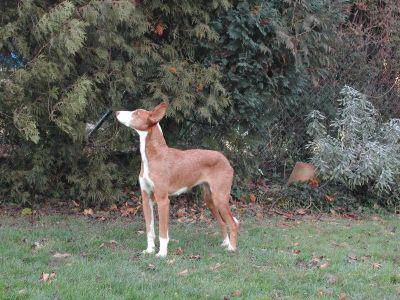

In [ ]:
Image(test_filenames[1000])

In [ ]:
len(test_filenames)

10357

In [ ]:
## efficient function banaya tha boht
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
%%time
test_preds=loaded_full_model.predict(test_data,verbose=1)
#predicting on test dataset of 10357 images

324/324 [==============================] - 46s 143ms/step
CPU times: user 39.2 s, sys: 1.82 s, total: 41 s
Wall time: 46.7 s


In [ ]:
np.savetxt("drive/MyDrive/Data/preds_array_final.csv",test_preds,delimiter=",")

In [ ]:
test_predictions_loaded=np.loadtxt("drive/MyDrive/Data/preds_array_final.csv",delimiter=",")

In [ ]:
test_predictions_loaded[:10]

array([[6.56055418e-11, 2.06822424e-11, 3.62754362e-14, ...,
        1.44886720e-13, 2.90305058e-10, 1.70590850e-11],
       [2.85572401e-06, 1.93054461e-06, 3.54099079e-08, ...,
        1.05962995e-10, 3.39619987e-07, 4.62359973e-09],
       [1.01899218e-10, 3.50281471e-06, 1.03077475e-08, ...,
        1.34565028e-07, 4.85079921e-10, 9.71213249e-11],
       ...,
       [6.92852264e-09, 7.30196903e-10, 5.97538907e-10, ...,
        4.58024460e-12, 2.95708839e-11, 2.93022467e-10],
       [1.53316040e-10, 5.76631076e-10, 9.62200319e-10, ...,
        3.84936726e-07, 4.14630730e-09, 5.92640451e-11],
       [7.22370608e-09, 3.06537185e-10, 2.82974894e-10, ...,
        8.90074906e-12, 6.40015041e-10, 5.80965548e-07]])

### Making predictions on custom images

1.Preprocessing like every other Dataset

In [ ]:
custom_path="/content/drive/MyDrive/Data/custom_photos/"
custom_filenames=[custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_filenames

['/content/drive/MyDrive/Data/custom_photos/happy-labrador-retriever-getty-0322-2000-eb585d9e672e47da8b1b7e9d3215a5cb.jpg',
 '/content/drive/MyDrive/Data/custom_photos/breed_profile_germansheperd_1118000_profile_2608-d7a78e7c1cf049879bec1ec19113ee42.jpg']

In [ ]:
## no label so test_data = true
custom_data_batch=create_data_batches(custom_filenames,test_data=True)

Creating test data batches


In [ ]:
custom_preds=loaded_full_model.predict(custom_data_batch)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
## getting custom image label
custom_pred_label=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
custom_pred_label

['labrador_retriever', 'german_shepherd']

#### Was that the actual photo ? patah nai?


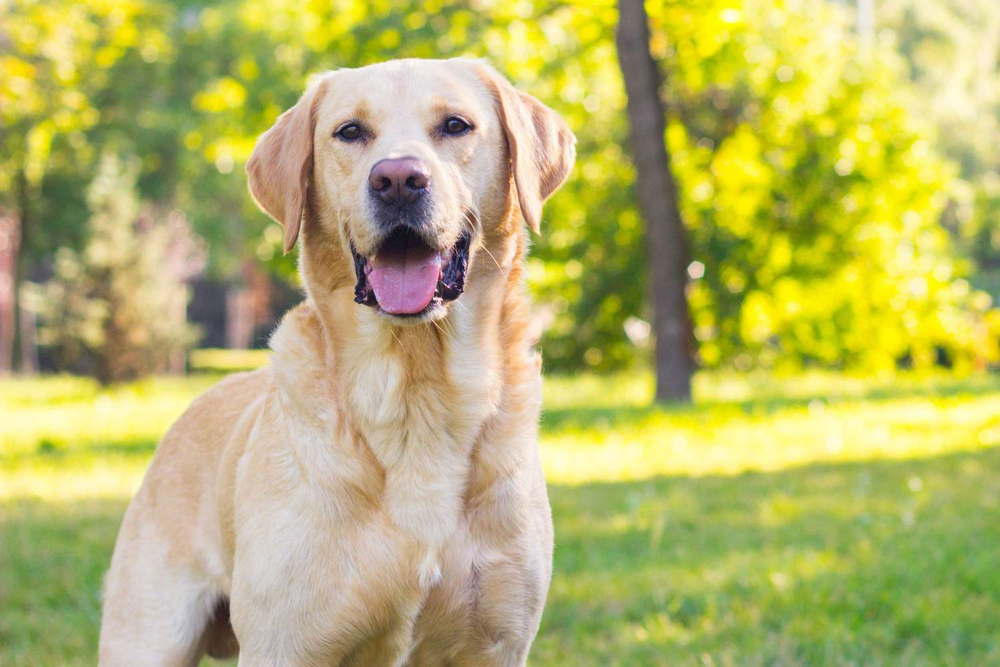

In [ ]:
Image(custom_filenames[0])

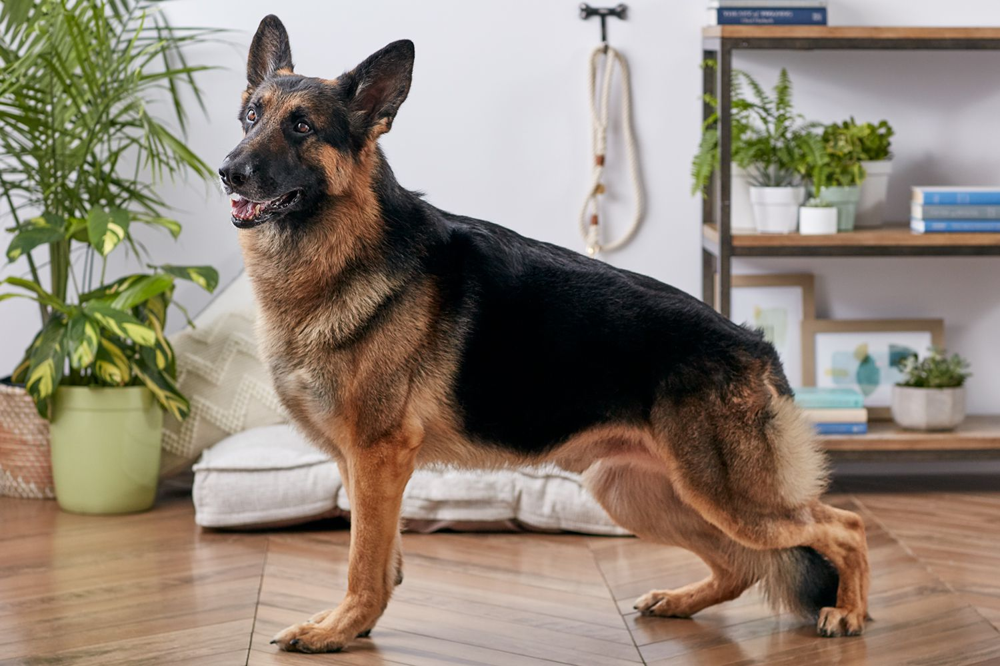

In [ ]:
Image(custom_filenames[1])

##### SOOOOOO AMazed!!! those are accurate predictions


##### "Completed on 4th july 2023"